In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud

# the plotting libs
import holoviews as hv
# gives the ability to call hvplot on a dataframe
import hvplot.pandas
import colorcet as cc
# The map tiles provider
from holoviews.element.tiles import EsriImagery
# a module for downsampling
from holoviews.operation.datashader import datashade
from datashader.utils import lnglat_to_meters
hv.extension('bokeh')
from bokeh.models import HoverTool

In [10]:
RSRP_data = pd.read_csv("RSRP.csv")
Traffic_volumn_data = pd.read_csv("TrafficVolume.csv")

In [4]:
RSRP_data.head(10)

,Timestamp,LocationLatitude,LocationLongitude,RadioConnectionType,Country,RadioNetworkGeneration,RadioOperatorName,RSRP,RadioMobileDataEnabled,DeviceManufacturer,DeviceName
0,2019-11-02 00:09:29.386 +0300,24.54054,46.784737,Mobile,Saudi Arabia,4G,Operator C,2147483647,Enabled,HTC,D728W
1,2019-11-02 00:09:29.386 +0300,24.54054,46.784737,Mobile,Saudi Arabia,4G,Operator C,2147483647,Enabled,HTC,Desire 728 Dual Sim
2,2019-11-02 00:10:45.323 +0300,24.54054,46.784737,Mobile,Saudi Arabia,3G,Operator C,2147483647,Enabled,HTC,D728W
3,2019-11-02 00:10:45.323 +0300,24.54054,46.784737,Mobile,Saudi Arabia,3G,Operator C,2147483647,Enabled,HTC,Desire 728 Dual Sim
4,2019-11-02 00:11:26.822 +0300,24.54054,46.784737,Mobile,Saudi Arabia,4G,Operator C,2147483647,Enabled,HTC,D728W
5,2019-11-02 00:11:26.822 +0300,24.54054,46.784737,Mobile,Saudi Arabia,4G,Operator C,2147483647,Enabled,HTC,Desire 728 Dual Sim
6,2019-11-02 00:17:44.340 +0300,24.54054,46.784737,Mobile,Saudi Arabia,3G,Operator C,2147483647,Enabled,HTC,D728W
7,2019-11-02 00:17:44.340 +0300,24.54054,46.784737,Mobile,Saudi Arabia,3G,Operator C,2147483647,Enabled,HTC,Desire 728 Dual Sim
8,2019-11-02 00:23:41.693 +0300,24.54054,46.784737,Mobile,Saudi Arabia,2G,Operator C,2147483647,Enabled,HTC,D728W
9,2019-11-02 00:23:41.693 +0300,24.54054,46.784737,Mobile,Saudi Arabia,2G,Operator C,2147483647,Enabled,HTC,Desire 728 Dual Sim


In [5]:
RSRP_data.sample(20)

,Timestamp,LocationLatitude,LocationLongitude,RadioConnectionType,Country,RadioNetworkGeneration,RadioOperatorName,RSRP,RadioMobileDataEnabled,DeviceManufacturer,DeviceName
1709630,2019-11-03 22:43:18.008 +0300,24.546644,46.688750,Mobile,Saudi Arabia,4G,Operator B,-91,Enabled,samsung,Galaxy S8
308421,2019-11-02 10:47:33.000 +0300,24.663660,46.705730,Mobile,Saudi Arabia,4G,Operator C,-84,Enabled,samsung,Galaxy J6
1939260,2019-11-03 23:39:11.001 +0300,24.767666,46.770640,Mobile,Saudi Arabia,3G,Operator B,2147483647,Enabled,samsung,Galaxy J5 Prime
1234932,2019-11-03 18:45:46.038 +0300,24.674643,46.670105,Mobile,Saudi Arabia,4G,Operator A,-96,Enabled,samsung,Galaxy A10
487137,2019-11-02 21:39:55.190 +0300,24.614155,46.669884,Mobile,Saudi Arabia,4G,Operator A,-71,Enabled,samsung,Galaxy Note8
1919318,2019-11-04 12:40:05.001 +0300,24.798725,46.796406,Mobile,Saudi Arabia,4G,Operator C,-72,Enabled,samsung,Galaxy A20S
121743,2019-11-02 08:21:05.068 +0300,24.596699,46.680412,Mobile,Saudi Arabia,4G,Operator A,-83,Enabled,samsung,Galaxy Note8
1432899,2019-11-04 15:09:23.047 +0300,24.801956,46.738980,Mobile,Saudi Arabia,4G,Operator A,-107,Enabled,samsung,Galaxy Note8
2256144,2019-11-04 07:57:11.978 +0300,24.587126,46.764874,Mobile,Saudi Arabia,4G,Operator B,-106,Enabled,samsung,Galaxy Note4
1286779,2019-11-03 12:22:09.013 +0300,24.836560,46.739876,Mobile,Saudi Arabia,4G,Operator A,-91,Enabled,samsung,Galaxy Note4


In [6]:
RSRP_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2725353 entries, 0 to 2725352
Data columns (total 11 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   Timestamp               object 
 1   LocationLatitude        float64
 2   LocationLongitude       float64
 3   RadioConnectionType     object 
 4   Country                 object 
 5   RadioNetworkGeneration  object 
 6   RadioOperatorName       object 
 7   RSRP                    int64  
 8   RadioMobileDataEnabled  object 
 9   DeviceManufacturer      object 
 10  DeviceName              object 
dtypes: float64(2), int64(1), object(8)
memory usage: 228.7+ MB


In [11]:
# let's look at the 'Country' column, seems all the values are Saudi Arabia
RSRP_data["Country"].value_counts()

Saudi Arabia    2725197
Name: Country, dtype: int64

**Since There's only one value in this column, it should be removed since it does not contain much information.**

In [12]:
#There only one value in the Country column, it's better to remove that column to simplify our data
RSRP_data.drop("Country", axis=1, inplace=True)

In [13]:
# let's look at the 'RadioConnectionType' column, seems all the values are Mobile
RSRP_data["RadioConnectionType"].value_counts()

Mobile     2717295
WiFi          7390
Unknown        668
Name: RadioConnectionType, dtype: int64

**Note:**
We have way more mobile instances than the other but still we can't delete the column like we did before.

In [14]:
RSRP_data["RadioMobileDataEnabled"].value_counts()

Enabled     2724635
Disabled        718
Name: RadioMobileDataEnabled, dtype: int64

**Again**, there is a class that is dominating and a few instances of the other.
We can't drop this column too, but data must be prepared if a classification will be used becuase of how skwed our dataset is towards a specific class. 

In [15]:
# let's take a look at the RadioNetworkGeneration
RSRP_data["RadioNetworkGeneration"].value_counts()

4G         2257240
3G          445246
Unknown      17361
2G            5464
WiFi            42
Name: RadioNetworkGeneration, dtype: int64

**4G domination!**

In [16]:
# let's take a look at the manufacturer
RSRP_data["DeviceManufacturer"].value_counts()

samsung       2404478
HUAWEI         111972
HTC             36046
LGE             30428
Xiaomi          25612
HMD Global      23497
motorola        19909
LENOVO          18679
TCL              9607
OnePlus          9559
OPPO             9108
vivo             6502
Lenovo           5862
Sony             4040
lenovo           3517
Realme           1760
realme           1598
PANASONIC        1224
QMobile           723
htc               578
LeEco             293
E1                135
ZTE               133
Hisense            40
OBI                18
SHARP              12
Mione               9
Infinix             8
LAVA                6
Name: DeviceManufacturer, dtype: int64

**There are things to notice here:**
- Samsung domination!
- Some manufacturer have different names for example: there's ( **Realme**, **realme** | **Lenovo**, **lenovo**, **LENOVO** | **HTC**, **htc** ). If we wish we can even join Realme, vivo, Oppo into one category since these belong to a single company.
- Another thing to notice here is the LGE manufacturer, this refers to the LG company. 


*Let's rename this to the most common name and name the duplicates with one exact name.*

In [17]:
RSRP_data["DeviceManufacturer"].replace("Realme", "realme", inplace=True)
RSRP_data["DeviceManufacturer"].replace("lenovo", "Lenovo", inplace=True)
RSRP_data["DeviceManufacturer"].replace("LENOVO", "Lenovo", inplace=True)
RSRP_data["DeviceManufacturer"].replace("htc", "HTC", inplace=True)
RSRP_data["DeviceManufacturer"].replace("LGE", "LG", inplace=True)
RSRP_data["DeviceManufacturer"].replace("samsung", "SAMSUNG", inplace=True)

In [18]:
RSRP_data["DeviceManufacturer"].value_counts()

SAMSUNG       2404478
HUAWEI         111972
HTC             36624
LG              30428
Lenovo          28058
Xiaomi          25612
HMD Global      23497
motorola        19909
TCL              9607
OnePlus          9559
OPPO             9108
vivo             6502
Sony             4040
realme           3358
PANASONIC        1224
QMobile           723
LeEco             293
E1                135
ZTE               133
Hisense            40
OBI                18
SHARP              12
Mione               9
Infinix             8
LAVA                6
Name: DeviceManufacturer, dtype: int64

**Now Lenovo is looking big!**

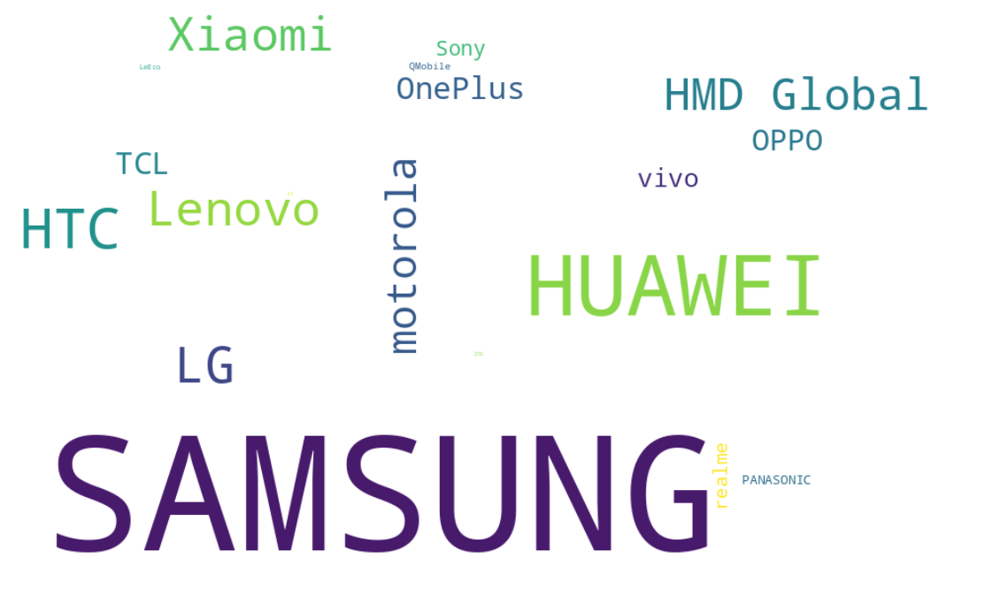

In [19]:
# Another way of plotting these values is by creating a wordcloud
manufacturer_word_cloud = WordCloud(background_color="white", width=1000, height=600)
img = manufacturer_word_cloud.generate_from_frequencies(RSRP_data["DeviceManufacturer"].value_counts())

plt.figure(figsize=(20,15))
plt.imshow(img, interpolation="bilinear")
plt.axis("off")
plt.show()

This visual shows how each class weight in a simple visualization.

**Now**, the *'Timestamp'* column must be converted ti the datetime datatype in pandas. The *'to_datetime'* method is used with the format parameter provided, this helps in making the conversion process quick and more accurate. The formate of the datatime can be deduced from the dataset. Pandas provides a nice way to represent the time in way similar to regex.

In [21]:
# Now let's convert the TimeStamp column to datetime type in pandas, the 'utc' parameter is essential here for this to work!
RSRP_data["Timestamp"] = pd.to_datetime(RSRP_data["Timestamp"], format="%Y-%m-%d %H:%M:%S.%f%z", utc=True)

In [22]:
RSRP_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2725353 entries, 0 to 2725352
Data columns (total 10 columns):
 #   Column                  Dtype              
---  ------                  -----              
 0   Timestamp               datetime64[ns, UTC]
 1   LocationLatitude        float64            
 2   LocationLongitude       float64            
 3   RadioConnectionType     object             
 4   RadioNetworkGeneration  object             
 5   RadioOperatorName       object             
 6   RSRP                    int64              
 7   RadioMobileDataEnabled  object             
 8   DeviceManufacturer      object             
 9   DeviceName              object             
dtypes: datetime64[ns, UTC](1), float64(2), int64(1), object(6)
memory usage: 207.9+ MB


Looking at the Timestamp column, the dtype of Timestamp is now a datetime type

Now let's check our numerical fields to check that they are in the valid range

The valid range for latitude is between +90 and -90, any values outside this range are invalid

In [25]:
RSRP_data[(RSRP_data['LocationLatitude'] > 90) | (RSRP_data['LocationLatitude'] < -90)].value_counts().sum()

0

**All latitude values are valid!**

The valid range for longitude is between +180 and -180, any values outside this range are invalid

In [26]:
RSRP_data[(RSRP_data['LocationLongitude'] > 180) | (RSRP_data['LocationLongitude'] < -180)].value_counts().sum()

0

**All longtitude values are valid!**

There something weird with the RSRP column here, there's a very big positive value and the rest are small negative ones.

The valid range for RSRP is [-44,-140]
Let's look up the invalid values.

In [20]:
RSRP_data_invalid = RSRP_data[(RSRP_data['RSRP'] > -44) | (RSRP_data['RSRP'] < -140)]
RSRP_data_invalid[RSRP_data_invalid["RSRP"] == 2147483647]

,Timestamp,LocationLatitude,LocationLongitude,RadioConnectionType,RadioNetworkGeneration,RadioOperatorName,RSRP,RadioMobileDataEnabled,DeviceManufacturer,DeviceName
0,2019-11-01 21:09:29.386000+00:00,24.540540,46.784737,Mobile,4G,Operator C,2147483647,Enabled,HTC,D728W
1,2019-11-01 21:09:29.386000+00:00,24.540540,46.784737,Mobile,4G,Operator C,2147483647,Enabled,HTC,Desire 728 Dual Sim
2,2019-11-01 21:10:45.323000+00:00,24.540540,46.784737,Mobile,3G,Operator C,2147483647,Enabled,HTC,D728W
3,2019-11-01 21:10:45.323000+00:00,24.540540,46.784737,Mobile,3G,Operator C,2147483647,Enabled,HTC,Desire 728 Dual Sim
4,2019-11-01 21:11:26.822000+00:00,24.540540,46.784737,Mobile,4G,Operator C,2147483647,Enabled,HTC,D728W
...,...,...,...,...,...,...,...,...,...,...
2724318,2019-11-02 15:59:42+00:00,24.723953,46.669780,Mobile,4G,Operator C,2147483647,Enabled,SAMSUNG,Galaxy On Nxt
2725269,2019-11-03 08:35:23.171000+00:00,24.812200,46.752940,Mobile,3G,Operator A,2147483647,Enabled,SAMSUNG,Galaxy A20S
2725270,2019-11-03 08:35:32.550000+00:00,24.812200,46.752940,Mobile,4G,Operator A,2147483647,Enabled,SAMSUNG,Galaxy A20S
2725316,2019-11-03 13:50:06.017000+00:00,24.812235,46.752796,Mobile,3G,Operator A,2147483647,Enabled,SAMSUNG,Galaxy A20S


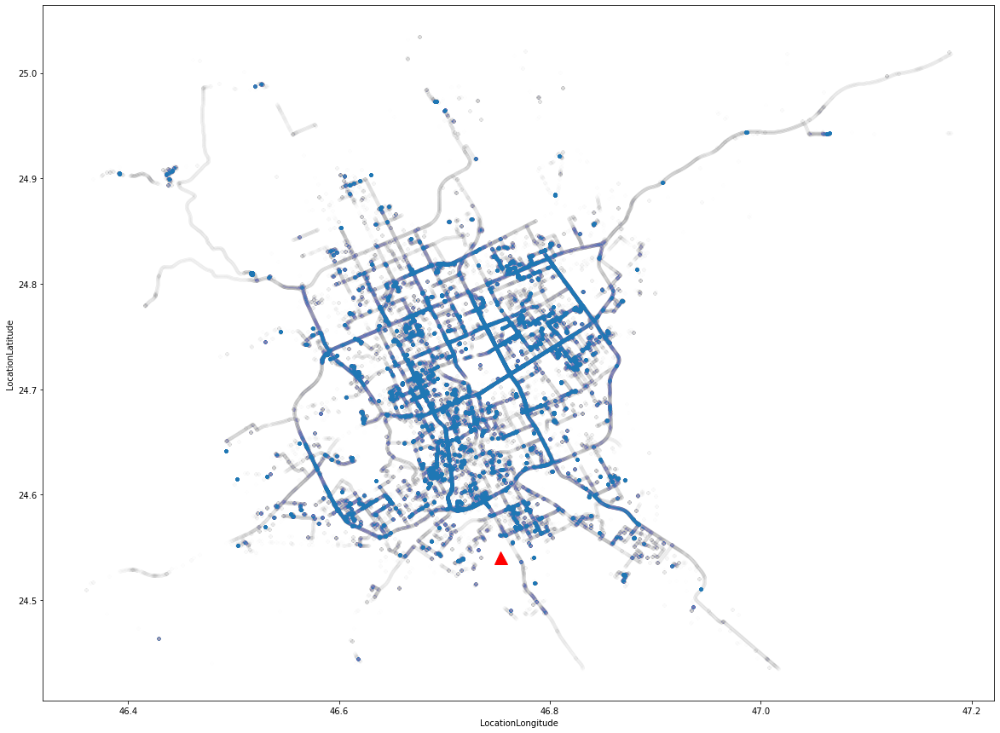

In [21]:
RSRP_data_invalid.plot(kind="scatter", 
                        x="LocationLongitude", 
                        y="LocationLatitude",
                        alpha=0.005,
                        figsize=(20,15))

plt.plot(46.752800, 24.540540, '^r', markersize=15)
plt.show()

***By looking at the google maps and using the red point as a refrence point we can see that this is map of Riyad city.***
<img src="riyad.png"/>

*Now let's look at our valid data:*

In [22]:
RSRP_data_valid = RSRP_data[(RSRP_data['RSRP'] < -44) & (RSRP_data['RSRP'] > -140)]
RSRP_data_valid.sample(40)

,Timestamp,LocationLatitude,LocationLongitude,RadioConnectionType,RadioNetworkGeneration,RadioOperatorName,RSRP,RadioMobileDataEnabled,DeviceManufacturer,DeviceName
801346,2019-11-03 16:29:41.080000+00:00,24.596565,46.680557,Mobile,4G,Operator A,-107,Enabled,SAMSUNG,Galaxy Note8
2246885,2019-11-03 06:12:22.924000+00:00,24.759703,46.673890,Mobile,4G,Operator B,-89,Enabled,SAMSUNG,Galaxy J7 Max
316313,2019-11-02 05:38:21.039000+00:00,24.735392,46.795177,Mobile,4G,Operator A,-81,Enabled,SAMSUNG,Galaxy On Nxt
1572683,2019-11-04 05:55:33.023000+00:00,24.583582,46.766150,Mobile,4G,Operator B,-83,Enabled,SAMSUNG,Galaxy Note4
1500641,2019-11-04 08:58:19.027000+00:00,24.589088,46.715380,Mobile,4G,Operator A,-72,Enabled,SAMSUNG,Galaxy On7 Prime
194884,2019-11-02 19:43:38+00:00,24.576000,46.605540,Mobile,4G,Operator A,-77,Enabled,SAMSUNG,Galaxy Note4
1906593,2019-11-04 17:19:07+00:00,24.788511,46.680380,Mobile,4G,Operator C,-70,Enabled,SAMSUNG,Galaxy J8
1774072,2019-11-03 20:17:16.027000+00:00,24.631472,46.712360,Mobile,4G,Operator A,-84,Enabled,SAMSUNG,Galaxy A10
2483031,2019-11-04 08:29:27+00:00,24.675287,46.663067,Mobile,4G,Operator C,-70,Enabled,SAMSUNG,Galaxy J7
746961,2019-11-02 14:16:24.021000+00:00,24.840374,46.748394,Mobile,4G,Operator A,-99,Enabled,SAMSUNG,Galaxy J7


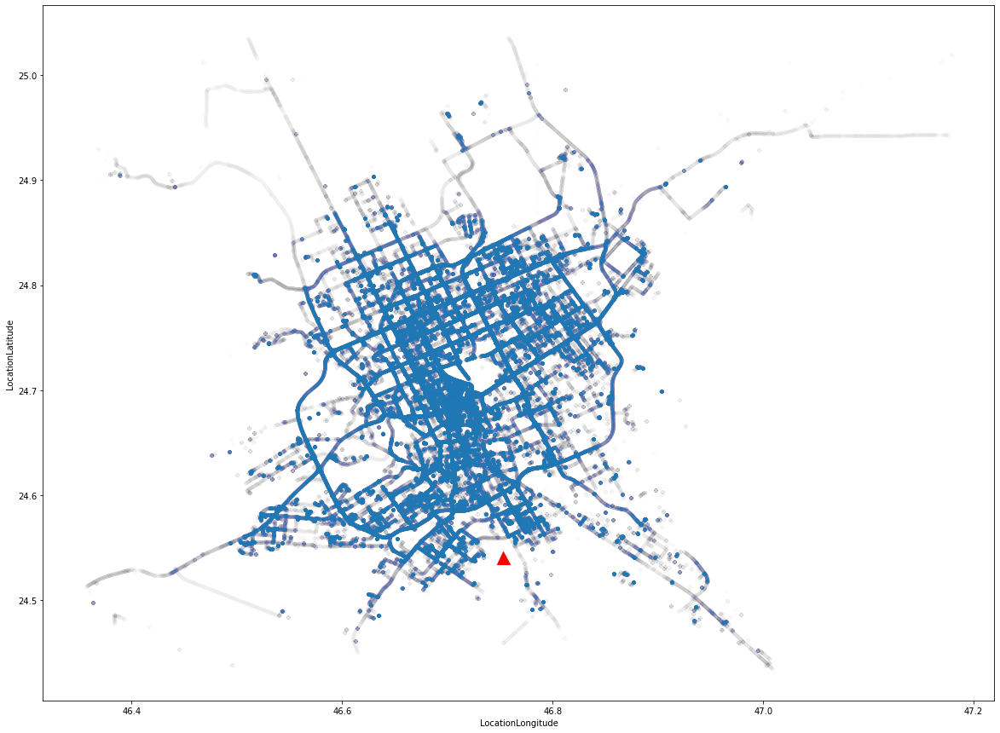

In [23]:
RSRP_data_valid.plot(kind="scatter", 
                        x="LocationLongitude", 
                        y="LocationLatitude",
                        alpha=0.005,
                        figsize=(20,15))

plt.plot(46.752800, 24.540540, '^r', markersize=15)
plt.show()

***Another map of Riyad***

In [24]:
# let's take another look
RSRP_data.sample(20)

,Timestamp,LocationLatitude,LocationLongitude,RadioConnectionType,RadioNetworkGeneration,RadioOperatorName,RSRP,RadioMobileDataEnabled,DeviceManufacturer,DeviceName
976252,2019-11-02 23:00:58.092000+00:00,24.596655,46.680676,Mobile,4G,Operator A,-71,Enabled,SAMSUNG,Galaxy Note8
541276,2019-11-03 08:50:52.869000+00:00,24.651117,46.697067,Mobile,4G,Operator C,-87,Enabled,SAMSUNG,Galaxy J6
2596499,2019-11-04 18:07:49.418000+00:00,24.780130,46.645645,Mobile,4G,Operator C,-79,Enabled,SAMSUNG,Galaxy J6
1765573,2019-11-03 20:38:37+00:00,24.613512,46.682724,Mobile,3G,Operator A,2147483647,Enabled,SAMSUNG,Galaxy J6
2425895,2019-11-04 18:01:01.999000+00:00,24.731743,46.776814,Mobile,4G,Operator A,-93,Enabled,SAMSUNG,Galaxy S8
1515436,2019-11-04 15:32:40+00:00,24.749878,46.780170,Mobile,4G,Operator A,-94,Enabled,SAMSUNG,Galaxy S6 Edge
283621,2019-11-02 06:39:49.001000+00:00,24.625190,46.668087,Mobile,4G,Operator C,-94,Enabled,SAMSUNG,Galaxy J6
1440267,2019-11-03 15:41:22.019000+00:00,24.704973,46.746450,Mobile,4G,Operator A,-76,Enabled,SAMSUNG,Galaxy J7 Neo
2408160,2019-11-04 18:08:52+00:00,24.678730,46.791664,Mobile,3G,Operator B,2147483647,Enabled,SAMSUNG,Galaxy J7
2341390,2019-11-04 05:19:12+00:00,24.758034,46.739540,Mobile,4G,Operator C,-76,Enabled,SAMSUNG,Galaxy J6


In [25]:
RSRP_data[(RSRP_data['RSRP'] > -44) | (RSRP_data['RSRP'] < -140)].value_counts().sum()

644163

In [26]:
RSRP_data_invalid.sample(20)

,Timestamp,LocationLatitude,LocationLongitude,RadioConnectionType,RadioNetworkGeneration,RadioOperatorName,RSRP,RadioMobileDataEnabled,DeviceManufacturer,DeviceName
97679,2019-11-02 06:21:11.027000+00:00,24.755415,46.740906,Mobile,3G,Operator A,2147483647,Enabled,SAMSUNG,Galaxy On7 Prime
1974224,2019-11-02 22:41:46+00:00,24.742952,46.670070,Mobile,3G,Operator B,2147483647,Enabled,SAMSUNG,Galaxy Grand Prime Plus
2412614,2019-11-04 08:18:28.028000+00:00,24.824860,46.748272,Mobile,3G,Operator B,2147483647,Enabled,SAMSUNG,Galaxy A7 (2018)
189410,2019-11-02 07:45:06.001000+00:00,24.668610,46.727750,Mobile,3G,Operator A,2147483647,Enabled,SAMSUNG,Galaxy Note4
686016,2019-11-02 11:46:03.197000+00:00,24.839918,46.692753,Mobile,3G,Operator A,2147483647,Enabled,SAMSUNG,Galaxy A50
243455,2019-11-02 14:01:50.025000+00:00,24.552797,46.680035,Mobile,3G,Operator A,2147483647,Enabled,SAMSUNG,Galaxy On7 Prime
1266472,2019-11-03 13:17:45+00:00,24.694397,46.678875,Mobile,3G,Operator C,2147483647,Enabled,SAMSUNG,Galaxy S7 Edge
1724187,2019-11-03 17:44:03+00:00,24.633610,46.584007,Mobile,4G,Operator A,2147483647,Enabled,SAMSUNG,Galaxy Note9
580625,2019-11-03 07:39:36.876000+00:00,24.570158,46.776540,Mobile,4G,Operator B,2147483647,Enabled,SAMSUNG,Galaxy Note4
172171,2019-11-02 12:28:50.797000+00:00,24.986238,46.812120,Mobile,4G,Operator A,2147483647,Enabled,SAMSUNG,Galaxy S5


In [27]:
RSRP_data_invalid["DeviceManufacturer"].value_counts()

SAMSUNG       598200
Lenovo         12956
HUAWEI         10099
motorola        4743
HTC             3876
LG              3025
OnePlus         2547
HMD Global      2442
Sony            1934
Xiaomi          1199
OPPO             855
vivo             546
QMobile          535
PANASONIC        496
TCL              324
realme           168
E1               135
Hisense           40
OBI                9
Mione              9
Infinix            8
ZTE                6
LAVA               6
SHARP              5
Name: DeviceManufacturer, dtype: int64

In [28]:
RSRP_data_invalid['RSRP'].value_counts()

 2147483647    643705
 0                455
-1                  2
 12                 1
Name: RSRP, dtype: int64

In [29]:
RSRP_data_invalid[RSRP_data_invalid["RSRP"] == 0].sample(20)

,Timestamp,LocationLatitude,LocationLongitude,RadioConnectionType,RadioNetworkGeneration,RadioOperatorName,RSRP,RadioMobileDataEnabled,DeviceManufacturer,DeviceName
142020,2019-11-02 13:55:32.027000+00:00,24.688690,46.724140,Mobile,4G,Operator A,0,Enabled,HUAWEI,Y6Ii
141885,2019-11-02 11:28:37.034000+00:00,24.834715,46.588284,Mobile,4G,Operator A,0,Enabled,HUAWEI,Y6Ii
141820,2019-11-02 11:25:47.042000+00:00,24.821453,46.601475,Mobile,4G,Operator A,0,Enabled,HUAWEI,Y6Ii
142025,2019-11-02 14:30:17.030000+00:00,24.631006,46.719193,Mobile,4G,Operator A,0,Enabled,HUAWEI,Y6Ii
141900,2019-11-02 11:29:27.037000+00:00,24.833345,46.582480,Mobile,4G,Operator A,0,Enabled,HUAWEI,Y6Ii
1547422,2019-11-04 14:38:30.510000+00:00,24.637589,46.710840,Mobile,3G,Operator B,0,Enabled,HUAWEI,Honor 6X
142062,2019-11-02 14:31:42.024000+00:00,24.630087,46.717342,Mobile,4G,Operator A,0,Enabled,HUAWEI,Y6Ii
157119,2019-11-02 11:25:28.011000+00:00,24.822678,46.604393,Mobile,4G,Operator A,0,Enabled,HUAWEI,Y6Ii
2716135,2019-11-03 13:58:59.025000+00:00,24.667978,46.729897,Mobile,4G,Operator A,0,Enabled,HUAWEI,Y6Ii
10047,2019-11-02 11:35:40.053000+00:00,24.826994,46.565285,Mobile,4G,Operator A,0,Enabled,HUAWEI,Y6Ii


In [30]:
RSRP_data_invalid["DeviceName"].value_counts()

Galaxy A7 (2018)    103799
Galaxy J6            69785
Galaxy On7 Prime     47702
Galaxy Note4         45088
Galaxy S7 Edge       31853
                     ...  
P20Pro                   1
P20 Pro                  1
Z6 Pro                   1
Z6                       1
Redmi Note 8 Pro         1
Name: DeviceName, Length: 255, dtype: int64

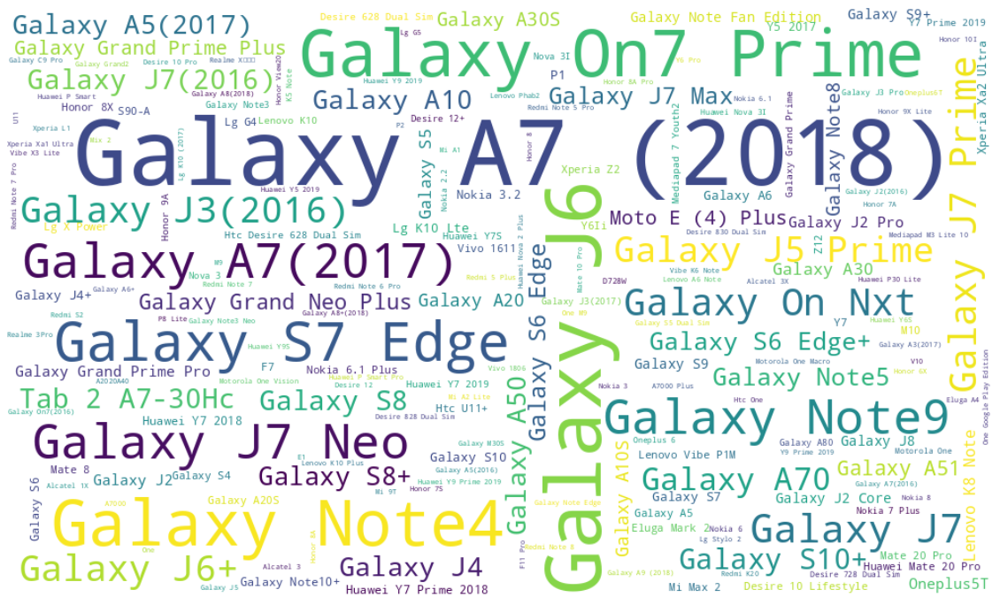

In [31]:
# Another way of plotting these values by creating a wordcloud
manufacturer_word_cloud = WordCloud(background_color="white", width=1000, height=600)
img = manufacturer_word_cloud.generate_from_frequencies(RSRP_data_invalid["DeviceName"].value_counts())

plt.figure(figsize=(20,15))
plt.imshow(img, interpolation="bilinear")
plt.axis("off")
plt.show()

In [32]:
# Don't use the 'TimeStamp' as an index because there are duplicates!
RSRP_data_valid_time_sorted = RSRP_data_valid.sort_values(by="Timestamp", ignore_index=True)
# RSRP_data_valid_time_sorted = RSRP_data_valid_time_sorted.set_index("Timestamp")
RSRP_data_valid_time_sorted.head(10)

,Timestamp,LocationLatitude,LocationLongitude,RadioConnectionType,RadioNetworkGeneration,RadioOperatorName,RSRP,RadioMobileDataEnabled,DeviceManufacturer,DeviceName
0,2019-11-01 18:15:32.097000+00:00,24.639421,46.73017,Mobile,4G,Operator B,-110,Enabled,SAMSUNG,Galaxy S7 Edge
1,2019-11-01 18:15:32.505000+00:00,24.639421,46.73017,Mobile,4G,Operator B,-106,Enabled,SAMSUNG,Galaxy S7 Edge
2,2019-11-01 18:15:50.376000+00:00,24.639421,46.73017,Mobile,4G,Operator B,-93,Enabled,SAMSUNG,Galaxy S7 Edge
3,2019-11-01 18:20:11.389000+00:00,24.639421,46.73017,Mobile,4G,Operator B,-107,Enabled,SAMSUNG,Galaxy S7 Edge
4,2019-11-01 18:20:12.035000+00:00,24.639421,46.73017,Mobile,4G,Operator B,-111,Enabled,SAMSUNG,Galaxy S7 Edge
5,2019-11-01 18:20:13.264000+00:00,24.639421,46.73017,Mobile,4G,Operator B,-106,Enabled,SAMSUNG,Galaxy S7 Edge
6,2019-11-01 18:22:37.206000+00:00,24.639421,46.73017,Mobile,4G,Operator B,-98,Enabled,SAMSUNG,Galaxy S7 Edge
7,2019-11-01 18:36:43.521000+00:00,24.626589,46.68925,Mobile,4G,Operator C,-95,Enabled,SAMSUNG,Galaxy Grand Prime Plus
8,2019-11-01 18:38:01.192000+00:00,24.626589,46.68925,Mobile,4G,Operator C,-97,Enabled,SAMSUNG,Galaxy Grand Prime Plus
9,2019-11-01 18:40:45.978000+00:00,24.626589,46.68925,Mobile,4G,Operator C,-97,Enabled,SAMSUNG,Galaxy Grand Prime Plus


In [33]:
RSRP_data_houred = RSRP_data.copy()

# This step is needed to prepare the data to be plotted on the map
RSRP_data_houred["LocationLongitude"], RSRP_data_houred["LocationLatitude"] \
= lnglat_to_meters(RSRP_data_houred["LocationLongitude"], RSRP_data_houred["LocationLatitude"])

In [49]:
# Using the map tiles provided by Esri. OpenStreetMaps can be used as well
map_tiles = EsriImagery().opts( alpha=0.3, width=1000, height=700, bgcolor='black')

# users_points = hv.Points(RSRP_data_houred, ['LocationLongitude', 'LocationLatitude'])

# # downsampling using datashader
# users_points_downsampled = datashade(users_points, cmap=cc.fire, width=1000, height=700)

# # plotting the points over a map provided by the tiles elements 
# map_tiles * users_points_downsampled


plot = RSRP_data_houred.hvplot.scatter("LocationLongitude",
                                "LocationLatitude",
                                rasterize=True,
                                cmap=cc.fire,
                                cnorm='eq_hist',
                                colorbar=False,
                                xaxis=None,
                                yaxis=None,
                                hover_cols='all'
                                )

hover = HoverTool(names=['needshover'], 
                  tooltips="""
                            <div>
                                <span style="font-size: 17px; font-weight: bold;">Hello</span>
                            </div>
                            <img
                                src="riyad.png" height="100" alt="@imgs" width="100"
                                style="float: left; margin: 0px 15px 15px 0px;"
                                border="2"
                            />
                            """
                 )

plot.opts(tools=[hover])



map_tiles * plot

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Image.I :Image   [LocationLongitude,LocationLatitude]   (LocationLongitude_LocationLatitude Count)

In [35]:
data_parq = pd.read_parquet("RSRP_data_houred.parq")

In [36]:
RSRP_data.to_parquet("RSRP_data.parq")

In [37]:
RSRP_data = pd.read_parquet("RSRP_data.parq")


In [38]:
RSRP_data[
            (RSRP_data["RadioMobileDataEnabled"] == "Disabled") 
                &
            (RSRP_data["RadioConnectionType"]  == "WiFi")
         ].count()

Timestamp                 93
LocationLatitude          93
LocationLongitude         93
RadioConnectionType       93
RadioNetworkGeneration    93
RadioOperatorName         93
RSRP                      93
RadioMobileDataEnabled    93
DeviceManufacturer        93
DeviceName                93
dtype: int64